In [327]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd

### opencv

Для поиска по шаблону необходимо два основных компонента:

* Исходное изображение (I): изображение, в котором мы ожидаем найти совпадение с изображением шаблона.
* Образ шаблона (T): изображение патча, которое будет сравниваться с исходным изображением.

Цель - обнаружить область с наивысшим соответствием:

![](./Theory/Template_Matching_Template_Theory_Summary.jpg)

Чтобы определить совпадающую область, мы должны сравнить изображение шаблона с исходным изображением, сдвинув его:

![](./Theory/Template_Matching_Template_Theory_Sliding.jpg)
Под скольжением подразумевается перемещение патча на один пиксель за раз (слева направо, вверх вниз). В каждом месте рассчитывается метрика, которая показывает, насколько «хорошо» или «плохо» совпадение в этом месте (или насколько патч похож на эту конкретную область исходного изображения).
Для каждого местоположения T над I вы сохраняете метрику в результирующей матрице R . Каждое место(х, у) в R содержит метрику соответствия:

![](./Theory/Template_Matching_Template_Theory_Result.jpg)
изображение выше — результат R сдвига патча с метрикой TM_CCORR_NORMED . Самые яркие места указывают на самые высокие совпадения. Как видите, место, отмеченное красным кружком, вероятно, имеет наибольшее значение, поэтому это место (прямоугольник, образованный этой точкой как угол, а ширина и высота равны изображению патча) считается совпадающим.

На практике мы находим наибольшее значение (или меньшее, в зависимости от типа метода сопоставления) в матрице R , используя функцию minMaxLoc().


In [328]:
img = cv.imread('main.jpg',0)
template_list = []
for i in range(6):
    file_name = './Teamplates/template'+str(i)+'.jpg'
    template = cv.imread(file_name,0)
    template_list.append(template)

In [329]:
def find_on_img (image, template):
   
    w, h = template.shape[::-1]   

    method = eval('cv.TM_CCOEFF')
    res = cv.matchTemplate(image,template,method)
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)
    cv.rectangle(image,top_left, bottom_right, 255, 2)
    plt.subplot(131),plt.imshow(template,cmap = 'gray')
    plt.title('template'), plt.xticks([]), plt.yticks([])
    plt.subplot(132),plt.imshow(res,cmap = 'gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    plt.subplot(133),plt.imshow(image,cmap = 'gray')
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    plt.suptitle(meth)
    return plt


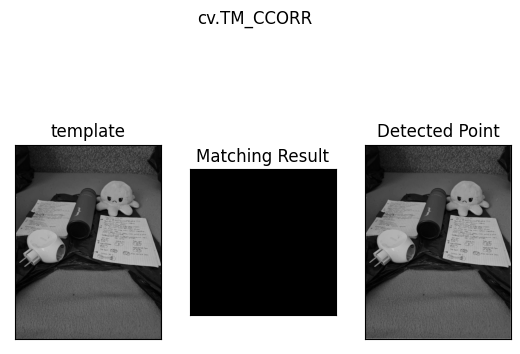

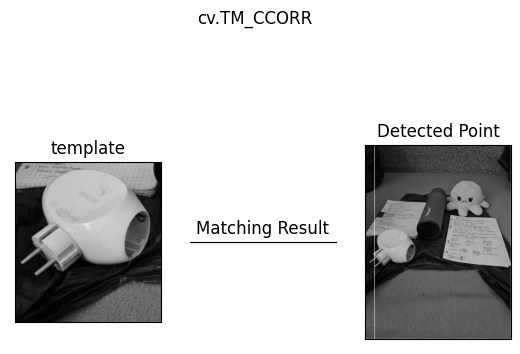

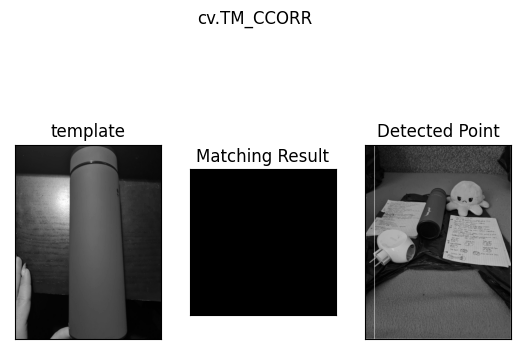

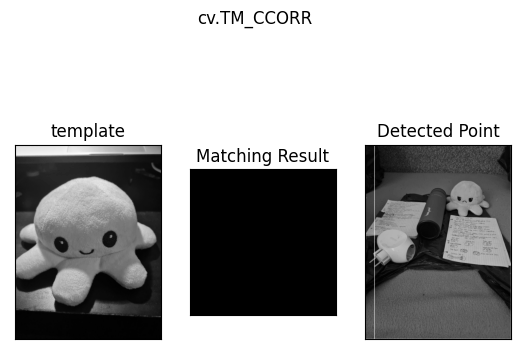

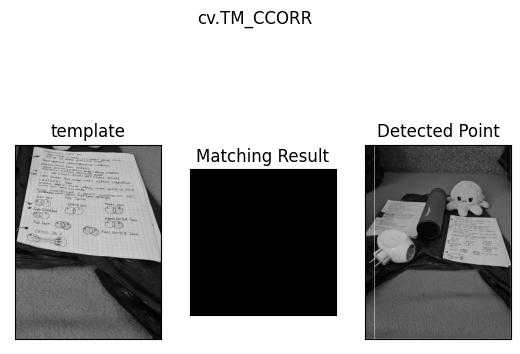

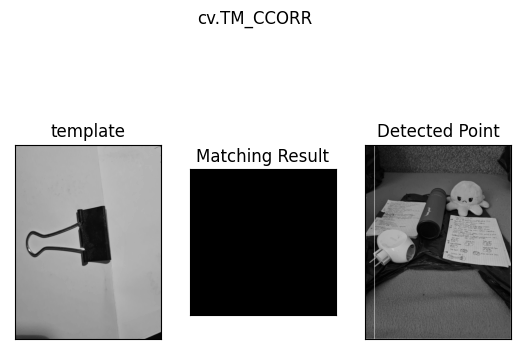

In [330]:
for template in template_list:
    plt = find_on_img(img, template)    
    plt.show()


In [331]:
img_e = cv.imread('main_e.jpg',0)
template_e_list = []
for i in range(6,9):
    file_name = './Teamplates/template'+str(i)+'.jpg'
    template = cv.imread(file_name,0)
    template_e_list.append(template)

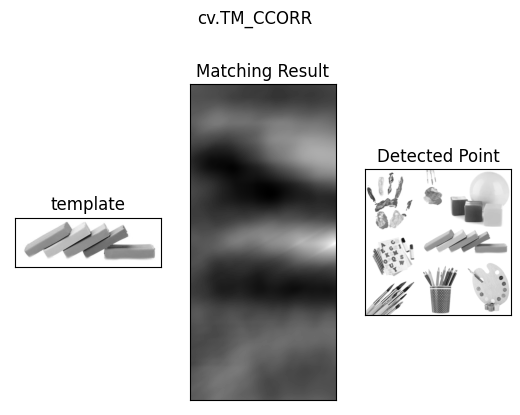

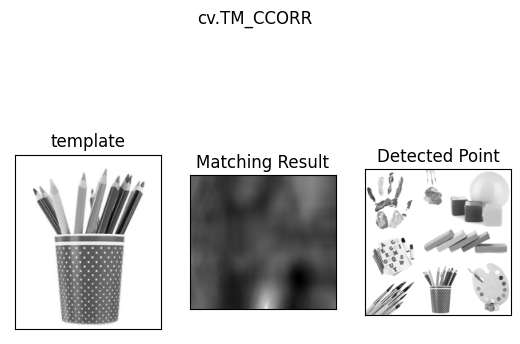

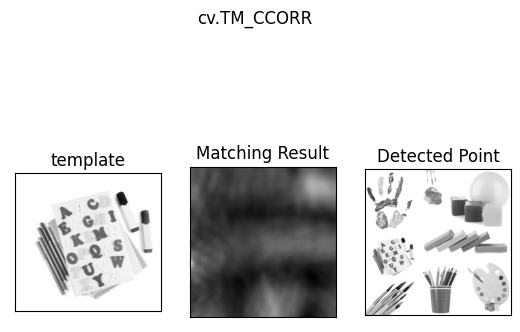

In [332]:
for template in template_e_list:
    plt = find_on_img(img_e, template)    
    plt.show()

In [333]:
img_mlp = cv.imread('my-little-pony.jpg',0)
template_mlp_list = []
for i in range(9,12):
    file_name = './Teamplates/template'+str(i)+'.jpg'
    template = cv.imread(file_name,0)
    template_mlp_list.append(template)

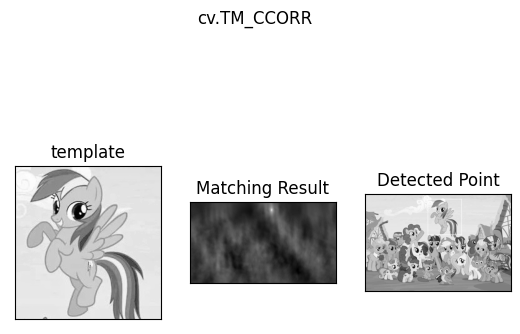

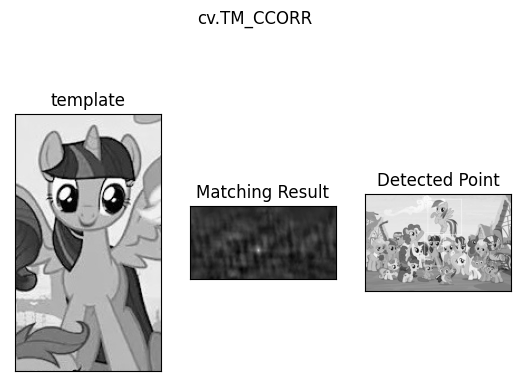

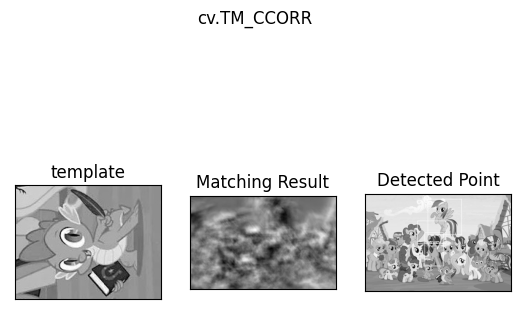

In [334]:
for template in template_mlp_list:
    plt = find_on_img(img_mlp, template)    
    plt.show()

### ORB

Развитием всех этих идей стал алгоритм ORB (Oriented FAST and Rotated BRIEF) [5], в котором сделана попытка улучшить производительноть BRIEF при повороте изображения. Предложено сначала вычислять ориентацию особой точки и затем проводить бинарные сравнения уже в соответствие с этой ориентацией. Работает алгоритм так:

1) Особые точки обнаруживаются при помощи быстрого древовидного FAST на исходном изображении и на нескольких изображениях из пирамиды уменьшенных изображений.

2) Для обнаруженных точек вычисляется мера Харриса, кандидаты с низким значением меры Харриса отбрасываются.

3) Вычисляется угол ориентации особой точки. Для этого, сначала вычисляются моменты яркости для окрестности особой точки:

${m_{pq}} = \sum\limits_{x,y} {{x^p}{y^q}I\left( {x,y} \right)}$

x,y – пиксельные координаты, I – яркость. И затем угол ориентации особой точки:

$\theta = {\rm{atan2}}\left( {{m_{01}},{m_{10}}} \right)$

Всё это авторы назвали «центроид ориентации». В итоге получаем некоторое направление для окрестности особой точки.

4) Имея угол ориентации особой точки, последовательность точек для бинарных сравнений в дескрипторе BRIEF поворачивается в соответствие с этим углом, например:

![](./Theory/ORB.jpg)

Если более формально, новые положения для точек бинарных тестов вычисляются так:

$\left( {\begin{array}{*{20}{c}} {{x_i}'}\\ {{y_i}'} \end{array}} \right) = R\left( \theta \right) \cdot \left( {\begin{array}{*{20}{c}} {{x_i}}\\ {{y_i}} \end{array}} \right)$



5) По полученным точкам вычисляется бинарный дескриптор BRIEF

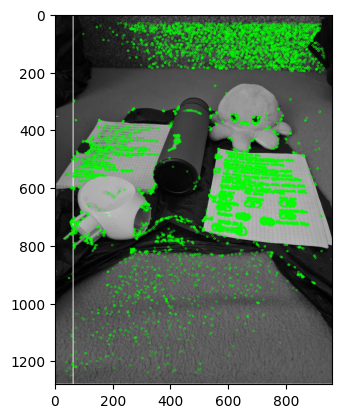

(<matplotlib.image.AxesImage at 0x285189a6310>, None)

In [335]:
mg = cv.imread('main.jpg',0)
orb = cv.ORB_create(100000)
kp = orb.detect(img,None)
kp, des = orb.compute(img, kp)
img2 = cv.drawKeypoints(img, kp, None, color=(0,255,0), flags=0)
plt.imshow(img2), plt.show()

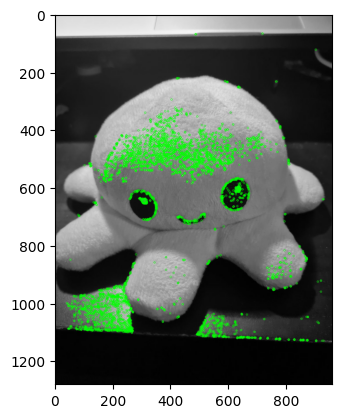

(<matplotlib.image.AxesImage at 0x285157aac90>, None)

In [336]:
img = cv.imread('./Teamplates/template3.jpg',0)
orb = cv.ORB_create(10000)
kp2 = orb.detect(img,None)
kp2, des2 = orb.compute(img, kp2)
img2 = cv.drawKeypoints(img, kp2, None, color=(0,255,0), flags=0)
plt.imshow(img2), plt.show()

In [337]:
img1 = cv.imread('main.jpg',cv.IMREAD_GRAYSCALE)
img2 = cv.imread('template3.jpg',cv.IMREAD_GRAYSCALE)
orb = cv.ORB_create(10000)
kp1, des1 = orb.detectAndCompute(img1,None)
kp2, des2 = orb.detectAndCompute(img2,None)

In [338]:
img = cv.imread('main.jpg',0)
template_list = []
for i in range(6):
    file_name = './Teamplates/template'+str(i)+'.jpg'
    template = cv.imread(file_name,0)
    template_list.append(template)

In [339]:
img_mlp = cv.imread('my-little-pony.jpg',0)
template_mlp_list = []
for i in range(9,13):
    file_name = './Teamplates/template'+str(i)+'.jpg'
    template = cv.imread(file_name,0)
    template_mlp_list.append(template)

In [340]:
def match_imgs(image, template, points_match):    
    orb = cv.ORB_create(10000)
    kp1, des1 = orb.detectAndCompute(image,None)
    kp2, des2 = orb.detectAndCompute(template,None)

    bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)
    matches = bf.match(des1,des2)
    matches = sorted(matches, key = lambda x:x.distance)
    img3 = cv.drawMatches(image,kp1,template,kp2,matches[:points_match],None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    plt.figure(figsize=(8, 6), dpi=100)
    plt.imshow(img3),plt.show()

    point_list = []
    for m in matches[:points_match]:
        point_list.append(m.queryIdx)
    c_list = cv.KeyPoint_convert(kp1)
    needed_c_list = []
    for p in point_list:
        needed_c_list.append(c_list[p])

    df = pd.DataFrame(needed_c_list, columns=['x','y'])
    y_max, y_min = int(df.y.max()),int(df.y.min())
    x_max, x_min = int(df.x.max()),int(df.x.min())
    img_to_show = image.copy()
    img4 = cv.rectangle(img_to_show, (x_max,y_max), (x_min,y_min),color=(255, 55, 0))
    plt.figure(figsize=(8, 6), dpi=100)
    plt.imshow(img4,cmap='gray')
    return plt


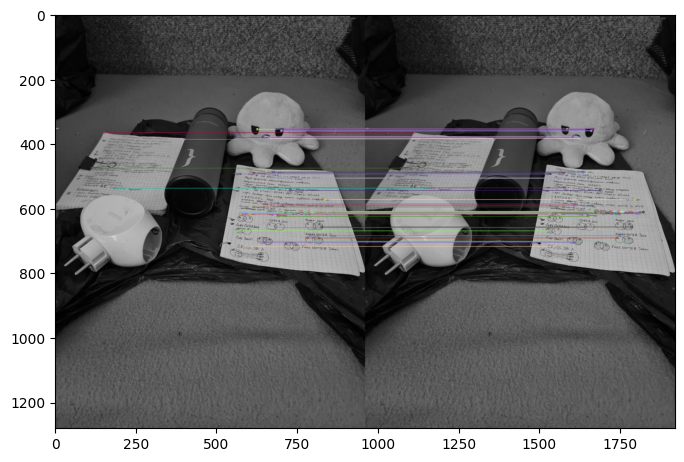

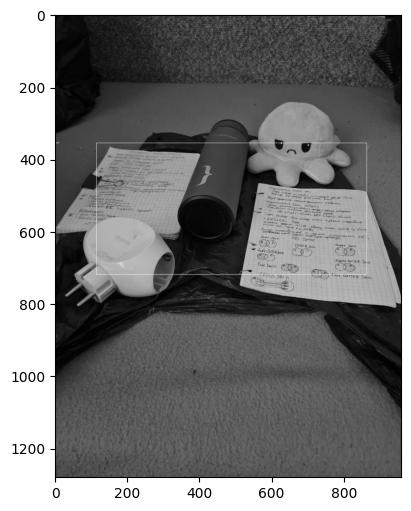

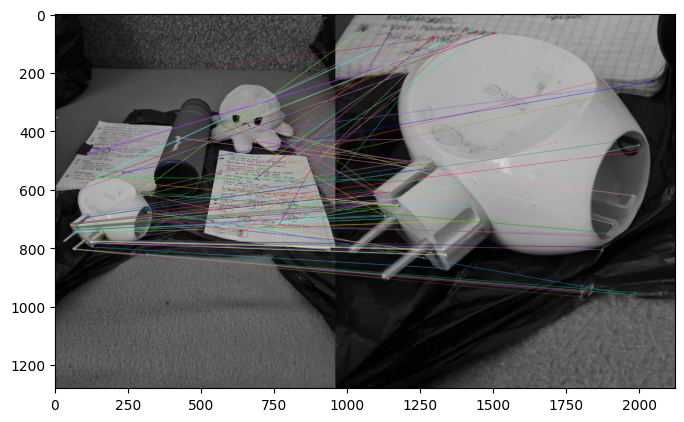

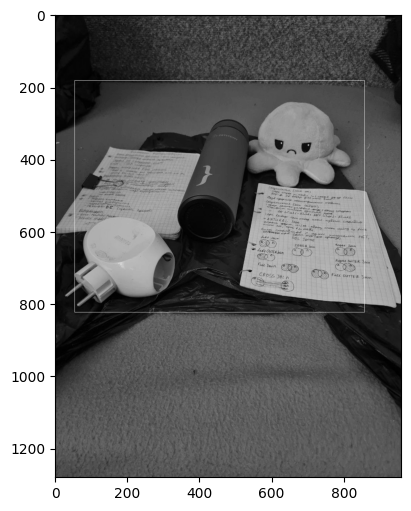

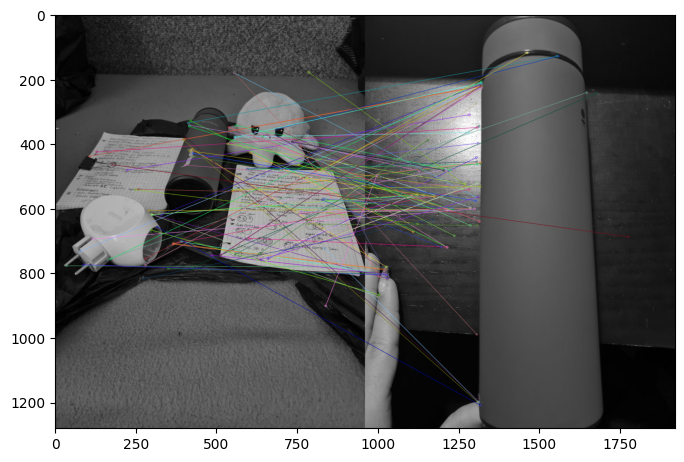

...

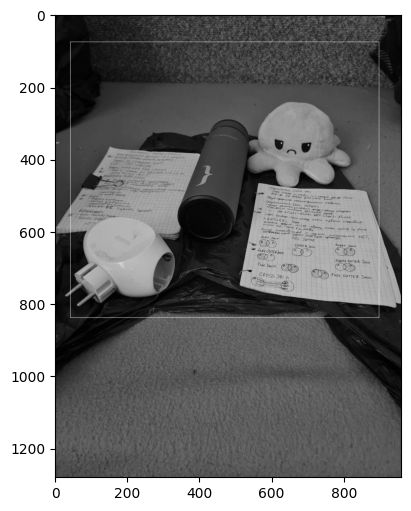

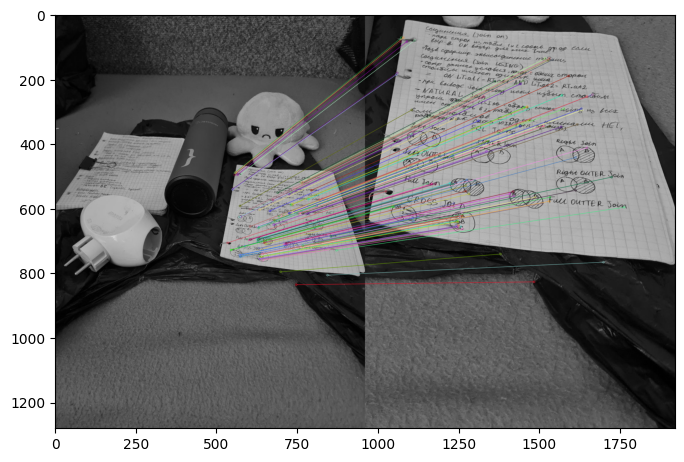

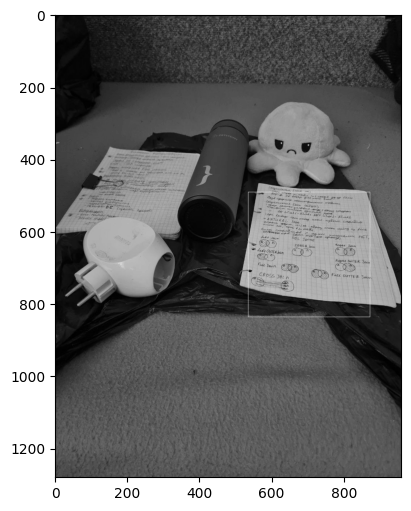

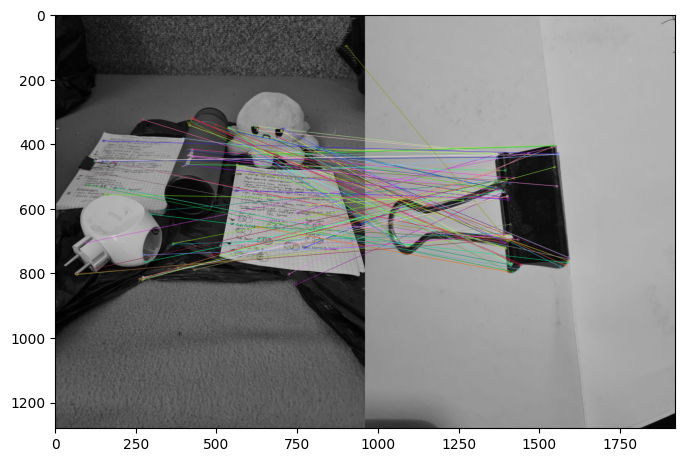

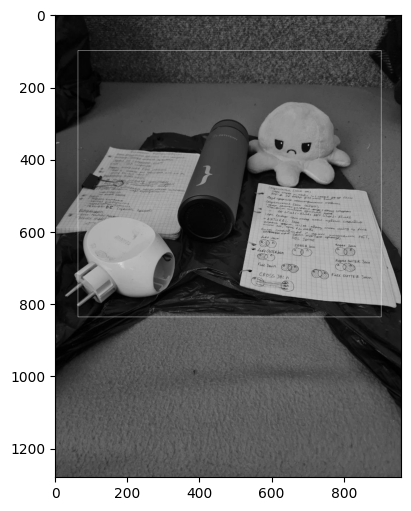

In [341]:
for template in template_list: 
    plt = match_imgs(img, template, 100)
    plt.show()

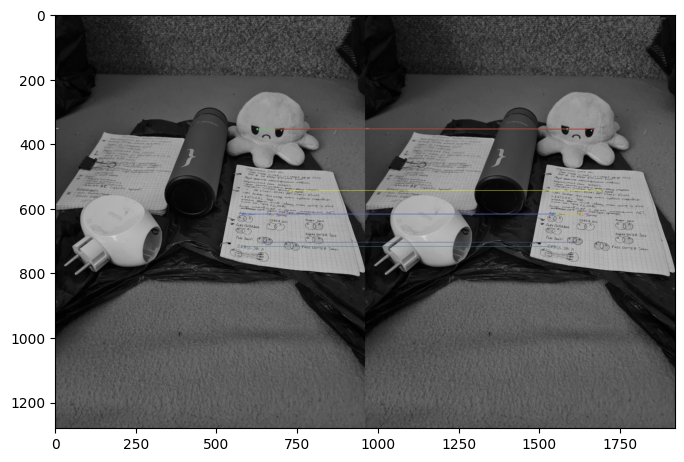

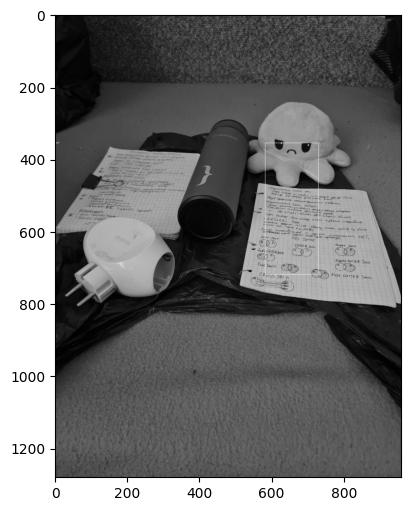

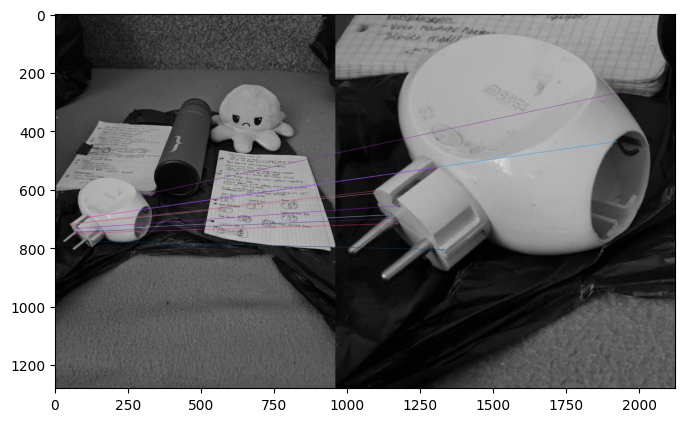

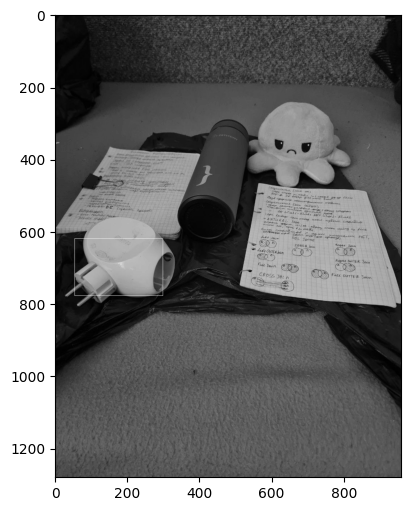

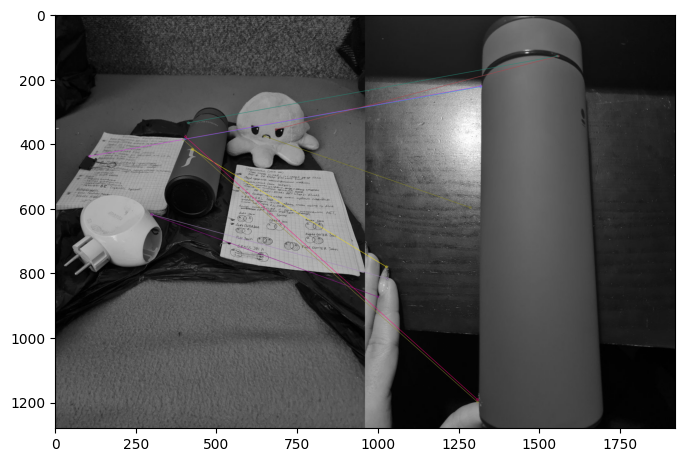

...

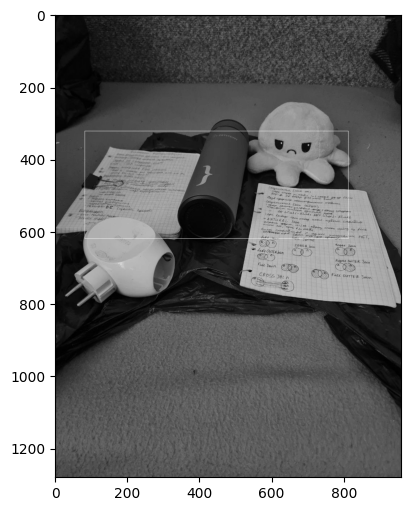

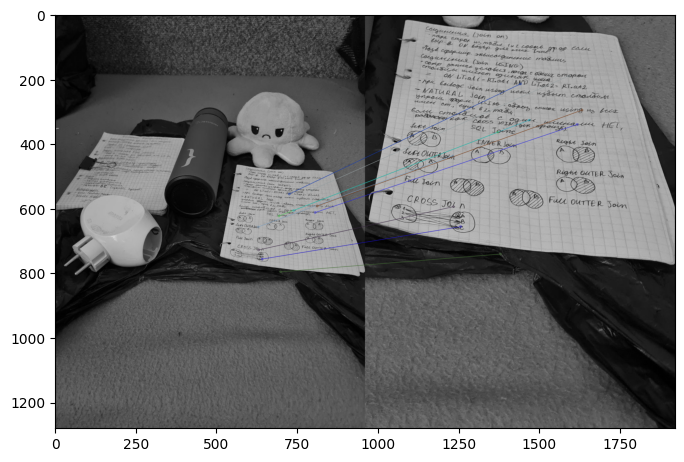

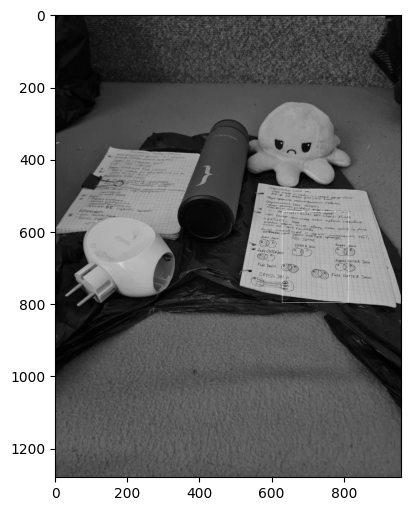

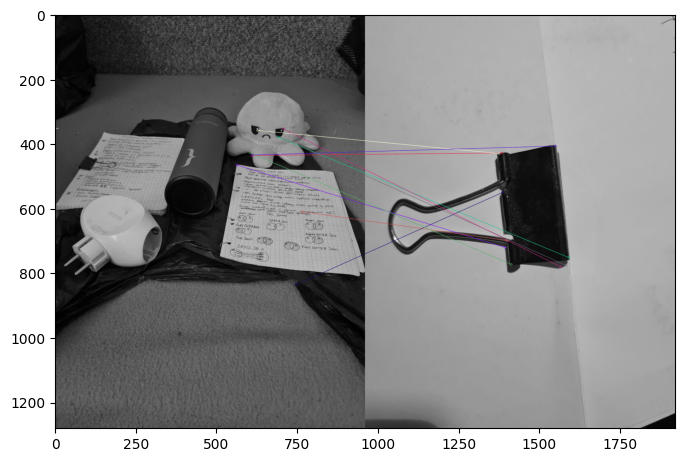

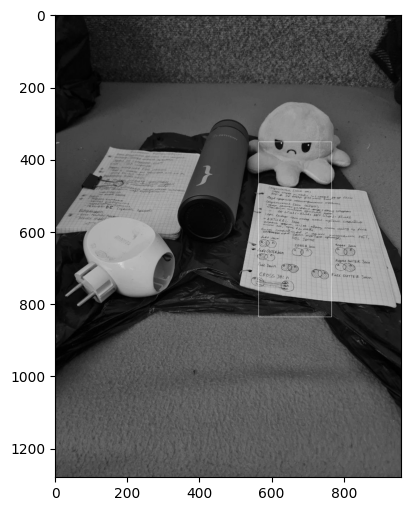

In [342]:
for template in template_list: 
    plt = match_imgs(img, template, 10)
    plt.show()

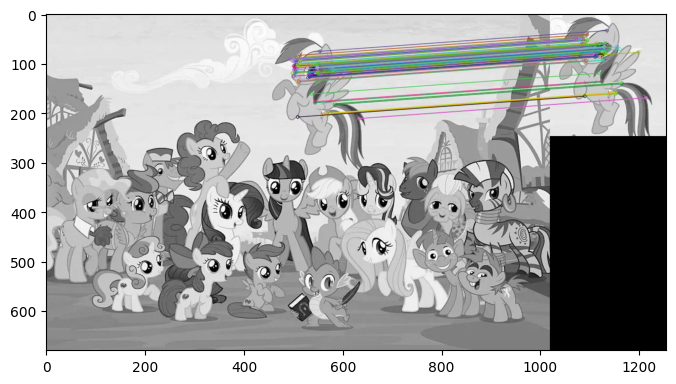

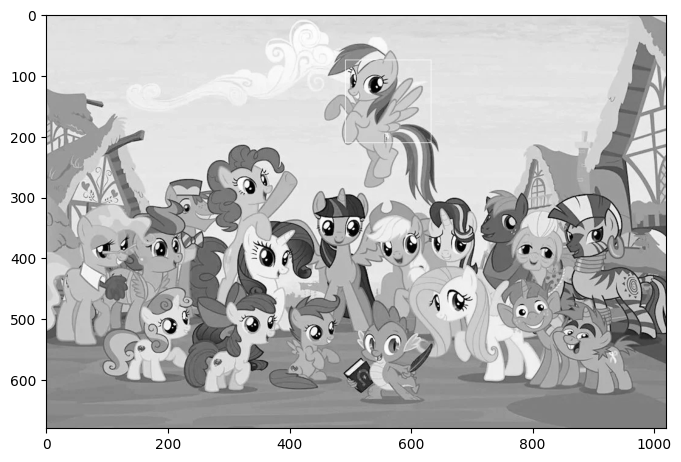

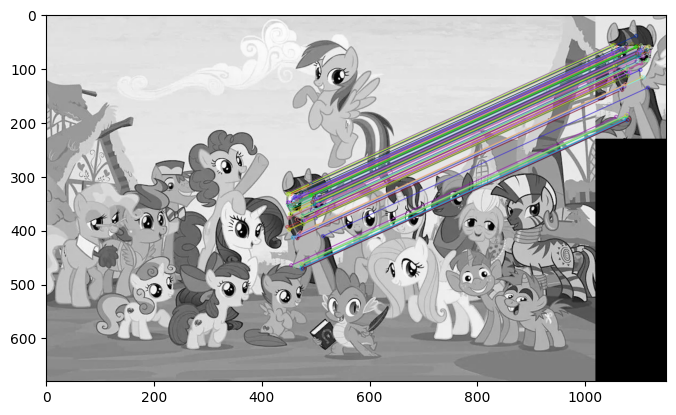

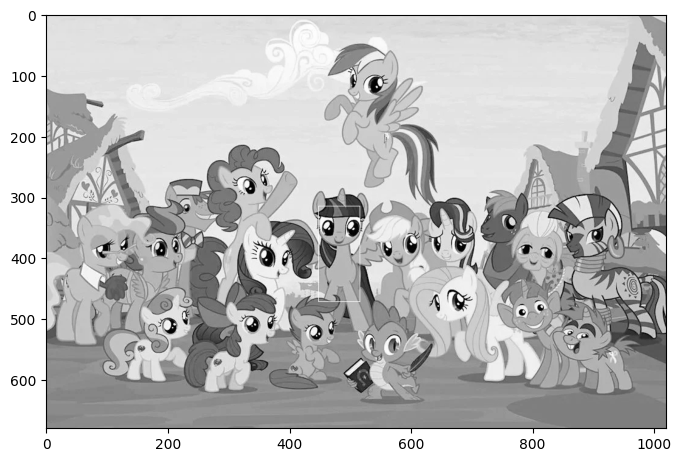

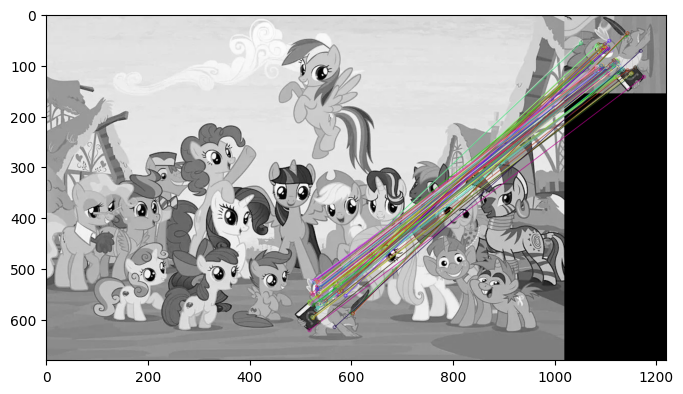

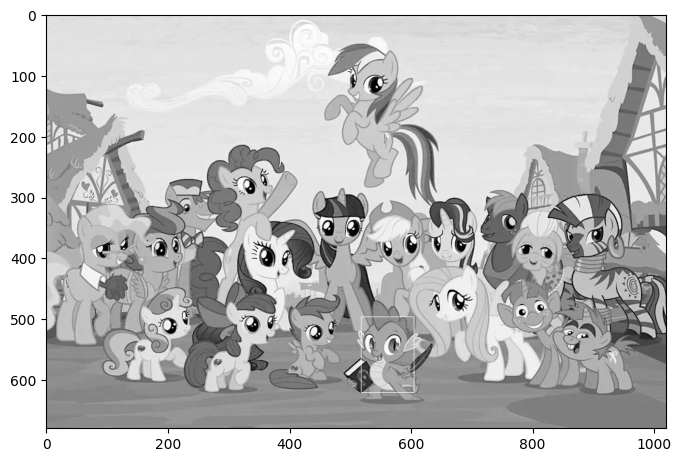

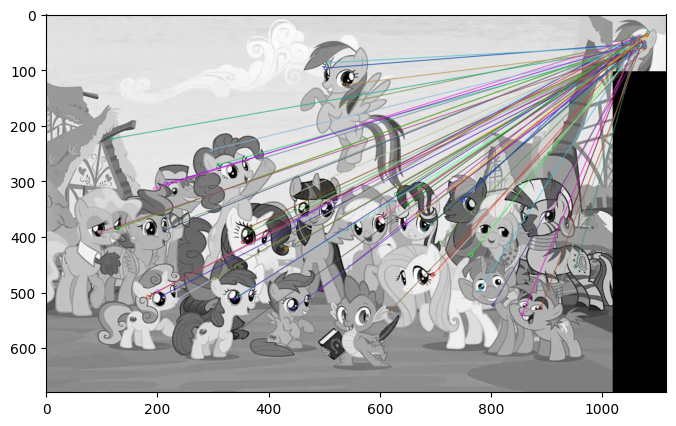

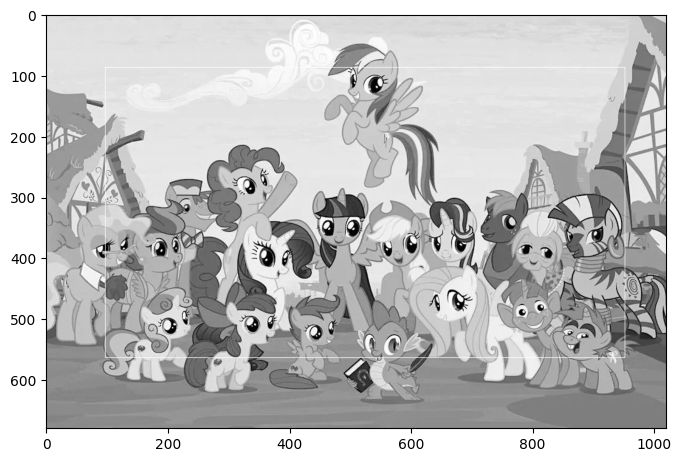

In [343]:
for template in template_mlp_list: 
    plt = match_imgs(img_mlp, template, 100)
    plt.show()